Mestrado em Modelagem Matematica da Informacao
----------------------------------------------
Disciplina: Modelagem e Mineracao de Dados
------------------------------------------

Master Program - Mathematical Modeling of Information
-----------------------------------------------------
Course: Data Mining and Modeling
--------------------------------

Professor: Renato Rocha Souza
-----------------------------

### Topic: Facebook, Visualization and NLP Analysis

Part of code adapted from:  
http://bit.ly/135dHfs and  
http://nbviewer.ipython.org/github/furukama/Mining-the-Social-Web-2nd-Edition/blob/master/ipynb/Chapter%202%20-%20Mining%20Facebook.ipynb  

Information on the Python Packages used:  
http://docs.python.org/library/os  
http://docs.python.org/library/sys.html  
http://docs.python.org/library/webbrowser.html  
http://docs.python.org/library/urllib.html  
http://docs.python.org/library/urllib2.html  
http://docs.python.org/library/json.html  
https://github.com/pythonforfacebook/facebook-sdk (was: https://github.com/facebook/python-sdk)  
http://nltk.org/  
http://docs.python.org/library/shutil.html  
http://docs.python.org/library/operator.html  
http://docs.python.org/library/copy.html  
http://docs.python.org/library/cgi.html  

In [1]:
import os
import sys
import pickle
import webbrowser
import json
import facebook
import nltk
import shutil
import operator
import codecs
import urllib
import urllib2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import requests
import networkx as nx
from networkx.readwrite import json_graph
from prettytable import PrettyTable
from collections import Counter
from copy import deepcopy
from cgi import escape
from IPython.display import Image, HTML, IFrame, FileLink, FileLinks #needed to render in notebook
from IPython.core.display import display

%matplotlib inline
# Set default figure size for this notebook
plt.rcParams['figure.figsize'] = (16.0, 12.8)

Specifying the path to the files

In [2]:
templates = "/home/rsouza/Dropbox/Renato/ModMinDados/Git/templates/"
outputs = "/home/rsouza/Dropbox/Renato/ModMinDados/outputs/"

tagcloud = 'template_tagcloud.html'
sunburst = 'template_sunburst.html'
rgraph = 'template_rgraph.html'
token = 'token_fb.txt'

graphhtml = 'fb_amigos.html'
graphhtmlgroup = 'fb_amigos_group.html'
graphjson = 'fb_amigos.json'
graphsun = 'fb_amigos_sun.html'
graphcloud = 'fb_tag_cloud.html'
csvfile = 'fb_amigos.csv'
dotfile = "fb_graph_fof.dot"

tagcloudtemplate = os.path.join(templates,tagcloud)
sunbursttemplate = os.path.join(templates,sunburst)
rgraphtemplate = os.path.join(templates,rgraph)

rgraphfile = os.path.join(outputs,graphhtml)
rgraphfile2 = os.path.join(outputs,graphhtmlgroup)
dumpjson = os.path.join(outputs,graphjson)
sungraphfile = os.path.join(outputs,graphsun)
graphcloudfile = os.path.join(outputs,graphcloud)
spreadsheet = os.path.join(outputs,csvfile)
facebook_token = os.path.join(outputs,token)
pathdotfile = os.path.join(outputs,dotfile)

Guia:  
https://smashballoon.com/custom-facebook-feed/access-token/  

Please generate your Facebook API Keys
http://www.facebook.com/developers

http://developers.facebook.com/tools/explorer  

Application must be autorized in:
http://developers.facebook.com/docs/authentication/

In [29]:
with open('facebook_tokens.txt', 'r') as facebook_tokens:
    tokens = facebook_tokens.read().split(',')

AppID = tokens[0].strip()
AppSecret = tokens[1].strip()
ACCESS_TOKEN = tokens[2].strip()

SiteURL = 'http://miningthesocialweb.appspot.com/static/facebook_oauth_helper.html'
LIMIT = 10

The method login() will be used only if there is no Facebook token generated yet. It will open a browser tab where you can copy your token

In [30]:
def login():
    '''
    You could customize which extended permissions are being requested on the login 
    page or by editing the list below. By default, all the ones that make sense for  
    read access as described on http://developers.facebook.com/docs/authentication/ 
    are included. (And yes, it would be probably be ridiculous to request this much 
    access if you wanted to launch a successful production application.)
    '''
    CLIENT_ID = AppID
    REDIRECT_URI = SiteURL
    EXTENDED_PERMS = [
            'user_about_me',
            'friends_about_me',
            'user_activities',
            'friends_activities',
            'user_birthday',
            'friends_birthday',
            'user_education_history',
            'friends_education_history',
            'user_events',
            'friends_events',
            'user_groups',
            'friends_groups',
            'user_hometown',
            'friends_hometown',
            'user_interests',
            'friends_interests',
            'user_likes',
            'friends_likes',
            'user_location',
            'friends_location',
            'user_notes',
            'friends_notes',
            'user_online_presence',
            'friends_online_presence',
            'user_photo_video_tags',
            'friends_photo_video_tags',
            'user_photos',
            'friends_photos',
            'user_relationships',
            'friends_relationships',
            'user_religion_politics',
            'friends_religion_politics',
            'user_status',
            'friends_status',
            'user_videos',
            'friends_videos',
            'user_website',
            'friends_website',
            'user_work_history',
            'friends_work_history',
            'email',
            'read_friendlists',
            'read_requests',
            'read_stream',
            'user_checkins',
            'friends_checkins',
            ]

    args = dict(client_id=CLIENT_ID, redirect_uri=REDIRECT_URI, scope=','.join(EXTENDED_PERMS),
                type='user_agent', display='popup')
    webbrowser.open('https://www.facebook.com/dialog/oauth?'+ urllib.urlencode(args))
    access_token = raw_input('Enter your access_token: ')
    f = open(facebook_token, 'w')
    f.write(access_token)
    f.close()
    print >> sys.stderr, "Access token stored to local file: {}".format(facebook_token)
    return access_token

Trying to authenticate and instantiating the API:

In [31]:
try:
    with open('facebook_tokens.txt', 'r') as facebook_tokens:
        tokens = facebook_tokens.read().split(',')
    AppID = tokens[0].strip()
    AppSecret = tokens[1].strip()
    ACCESS_TOKEN = tokens[2].strip()
    SiteURL = 'http://miningthesocialweb.appspot.com/static/facebook_oauth_helper.html'
    LIMIT = 10
except:
    ACCESS_TOKEN = login()

Queries with FQL:  
http://developers.facebook.com/docs/reference/fql/  
https://developers.facebook.com/docs/technical-guides/fql/  

In [32]:
class FQL(object):
    #Classe for complex queries using FQL
    #http://developers.facebook.com/docs/reference/fql/
    # A most powerful alternative to GRAPH API
    ENDPOINT = 'https://api.facebook.com/method/'

    def __init__(self, access_token=None):
        self.access_token = access_token

    def _fetch(cls, url, params=None):
        conn = urllib2.urlopen(url, data=urllib.urlencode(params))
        try:
            return json.loads(conn.read())
        finally:
            conn.close()

    def query(self, q):
        if q.strip().startswith('{'):
            return self.multiquery(q)
        else:
            params = dict(query=q, access_token=self.access_token, format='json')
            url = self.ENDPOINT + 'fql.query'
            return self._fetch(url, params=params)

    def multiquery(self, q):
        params = dict(queries=q, access_token=self.access_token, format='json')
        url = self.ENDPOINT + 'fql.multiquery'
        return self._fetch(url, params=params)

In [33]:
def fql_queries(fqlquery):
    fql = FQL(access_token=ACCESS_TOKEN)
    result = fql.query(fqlquery)
    return result

In [34]:
# A helper function to pretty-print Python objects as JSON
def pp(o): 
    print json.dumps(o, indent=1)

In [35]:
#https://developers.facebook.com/docs/reference/fql/user/
#https://developers.facebook.com/docs/reference/fql/friendlist/
#https://developers.facebook.com/docs/reference/fql/connection/

fqlquery0 = "select name, sex, birthday, about_me from user WHERE uid = me()"
fqlquery1 = "select gid, name from group where gid in (select gid from group_member where uid = me())"
fqlquery2 = "select name from friendlist WHERE owner = me()"
fqlquery3 = "select target_id from connection where source_id = me() and target_type = 'user' limit 5"
fqlquery4 = "select name, sex, relationship_status from user where uid in \
            (select target_id from connection where source_id = me() and target_type = 'user') limit 5"

fqlquery5 = """{"name_sex_relationships" : "select name, sex, relationship_status from user where uid in \
                (select target_id from #ids)","ids" : "select target_id from connection where source_id = me() \
                and target_type = 'user'"}"""

results = fql_queries(fqlquery0)
pp(results)

[
 {
  "birthday": null, 
  "about_me": null, 
  "name": "Renato Rocha Souza", 
  "sex": "male"
 }
]


Friends names

In [36]:
fqlquery6 = "select first_name, last_name, birthday from user WHERE uid IN (select uid1 FROM friend WHERE uid2 = me())"
#my_friends_names = [unicode(t['first_name']+' '+unicode(t['last_name'])) for t in fql_queries(fqlquery6)]
#pickle.dump(sorted(my_friends_names), open(os.path.join(outputs,"my_friends_names.pickle"),"wb"))
my_friends_names = pickle.load(open(os.path.join(outputs,"my_friends_names.pickle"),"rb"))
sorted(my_friends_names)[0:10]

[u'Adelina Cruz',
 u'Adelino Melo',
 u'Adelizia Marques de Oliveira',
 u'Adrian Giassone',
 u'Adriana Barbosa',
 u'Adriana Bogliolo',
 u'Adriana Casemiro',
 u'Adriana Duarte',
 u'Adriana Gomes Grinspun',
 u'Adriana Ribeiro']

Friends IDs

In [37]:
fqlquery7 = "select target_id from connection where source_id = me() and target_type = 'user'"
#my_friends_ids = [unicode(t['target_id']) for t in fql_queries(fqlquery7)]
#pickle.dump(my_friends_ids, open(os.path.join(outputs,"my_friends_ids.pickle"),"wb"))
my_friends_ids = pickle.load(open(os.path.join(outputs,"my_friends_ids.pickle"),"rb"))
my_friends_ids[0:10]

[u'500895670',
 u'501651554',
 u'503591544',
 u'509253544',
 u'522641902',
 u'524156145',
 u'525064046',
 u'525267012',
 u'526588864',
 u'527417227']

Mutual Friendships

In [38]:
fqlquery8 = "select uid1, uid2 from friend where uid1 in ({}) and uid2 in ({})".format(",".join(my_friends_ids),                                                                                     ",".join(my_friends_ids))
mutual_friendships = fql_queries(fqlquery8)
#mf = [(t['uid1'],t['uid2']) for t in mutual_friendships]
#pickle.dump(mf, open(os.path.join(outputs,"mutual_friendships.pickle"),"wb"))
mf = pickle.load( open(os.path.join(outputs,"mutual_friendships.pickle"),"rb" ))
mf[0:10]

[(u'500895670', u'585486903'),
 (u'500895670', u'721615058'),
 (u'500895670', u'1070611328'),
 (u'500895670', u'1075411265'),
 (u'500895670', u'1171645684'),
 (u'500895670', u'1281537203'),
 (u'500895670', u'1303341501'),
 (u'500895670', u'1303971429'),
 (u'500895670', u'1307241484'),
 (u'500895670', u'1308441387')]

Mutual Friendships - more information

In [39]:
fqlquery9 = "select uid, first_name, last_name, sex from user where uid in ({})".format(",".join(my_friends_ids),)
#names = dict([(int(u["uid"]), u["first_name"] + " " +u["last_name"][0] + ".") for u in fql_queries(fqlquery9)])
#pickle.dump(names, open(os.path.join(outputs,"names.pickle"),"wb"))
names = pickle.load(open(os.path.join(outputs,"names.pickle"),"rb" ))
gen_names = names.itervalues()
for i in range(5):
    print(gen_names.next())

Maria Izabel T.
Nicole S.
Sueli P.
Marcus V.
Renato M.


In [40]:
def graph_friends():
    '''
    Now get friendships amongst your friends. Note that this api appears to return 
    arbitrarily truncated results if you pass in more than a couple hundred friends 
    into each part of the query, so we perform (num friends)/N queries and aggregate 
    the results to try and get complete results
    Warning: this can result in a several API calls and a lot of data returned that 
    you'll have to process
    Get details about your friends, such as first and last name and create an accessible map
    note that not every id will necessarily information so be prepared to handle those cases 
    later
    '''
    fql = FQL(access_token=ACCESS_TOKEN)
    q = "select target_id from connection where source_id = me() and target_type ='user'"
    my_friends = [str(t['target_id']) for t in fql.query(q)]
    mutual_friendships = []
    N = 100
    for i in range(len(my_friends) / N + 1):
        q = 'select uid1, uid2 from friend where uid1 in ({}) and uid2 in ({})'.format \
            (','.join(my_friends), ','.join(my_friends[i * N:(i + 1) * N]))
        mutual_friendships += fql.query(q)   
    q = 'select uid, first_name, last_name, sex from user where uid in ({})'.format(','.join(my_friends), )
    results = fql.query(q)
    names = dict([(unicode(u['uid']), u['first_name'] + ' ' + u['last_name'][0] + '.') for u in results])
    sexes = dict([(unicode(u['uid']), u['sex']) for u in results])
    # consolidate a map of connection info about your friends.
    friendships = {}
    for f in mutual_friendships:
        (uid1, uid2) = (unicode(f['uid1']), unicode(f['uid2']))
        #(uid1, uid2) = (str(f['uid1']), str(f['uid2']))
        try: name1 = names[uid1]
        except KeyError, e:
            name1 = 'Unknown'
        try: name2 = names[uid2]
        except KeyError, e:
            name2 = 'Unknown'
        if friendships.has_key(uid1):
            if uid2 not in friendships[uid1]['friends']:
                friendships[uid1]['friends'].append(uid2)
        else:
            friendships[uid1] = {'name': name1, 'sex': sexes.get(uid1, ''),'friends': [uid2]}
        if friendships.has_key(uid2):
            if uid1 not in friendships[uid2]['friends']:
                friendships[uid2]['friends'].append(uid1)
        else:
            friendships[uid2] = {'name': name2, 'sex': sexes.get(uid2, ''),'friends': [uid1]}
    return friendships, names, sexes, mutual_friendships

Querying...

In [41]:
#friends_info = graph_friends()
#pickle.dump(friends_info, open(os.path.join(outputs,"friends_info.pickle"), "wb"))
friends_info = pickle.load(open(os.path.join(outputs,"friends_info.pickle"), "rb" ))
friendships, names, sexes, mutual_friendships = friends_info

Each output is a dictonary. Now we are going to generate Graphs...

In [42]:
def generate_rgraph_friends(friendships,names):    
    '''Emit JIT output for consumption by the visualization 
    Wrap the output in variable declaration and store into
    a file named facebook.rgraph.js for consumption by rgraph.html
    Write out another file that's standard JSON for additional analysis
    and potential use later
    '''    
    jit_output = []
    for fid in friendships:
        friendship = friendships[fid]
        adjacencies = friendship['friends']
        connections = '<br>'.join([names.get(a, 'Unknown') for a in adjacencies])
        normalized_popularity = 1.0 * len(adjacencies) / len(friendships)
        sex = friendship['sex']
        jit_output.append({
            'id': fid,
            'name': friendship['name'],
            'data': {'connections': connections, 'normalized_popularity'
                     : normalized_popularity, 'sex': sex},
                     'adjacencies': adjacencies,
                     })

    html = open(rgraphtemplate).read() %(json.dumps(jit_output),)
    f = open(rgraphfile, 'w')
    f.write(html)
    f.close()
    print >> sys.stderr, 'Data exported to file: {}'.format(f.name)
    #Saving JSON...
    json_f = open(dumpjson, 'w')
    json_f.write(json.dumps(jit_output, indent=4))
    json_f.close()
    print('Data exported to file: {}'.format(json_f.name))

In [43]:
generate_rgraph_friends(friendships,names)
# Open up the web page in your browser
webbrowser.open(os.path.join('file://', rgraphfile))

Data exported to file: /home/rsouza/Dropbox/Renato/ModMinDados/outputs/fb_amigos.json


Data exported to file: /home/rsouza/Dropbox/Renato/ModMinDados/outputs/fb_amigos.html


True

In [44]:
def generate_sungraph_friends():
    # Uses the previously saved JSON file
    data = json.loads(open(dumpjson).read())
    # Define colors to be used in the visualization for aesthetics
    colors = ['#FF0000', '#00FF00', '#0000FF']
    # The primary output to collect input
    jit_output = {
        'id': 'friends',
        'name': 'friends',
        'data': {'$type': 'none'},
        'children': [],
        }
    # A convenience template
    template = {
        'id': 'friends',
        'name': 'friends',
        'data': {'connections': '', '$angularWidth': 1, '$color': ''},
        'children': [],
        }
    i = 0
    for g in ['male', 'female']:
        # Create a gender object
        go = deepcopy(template)
        go['id'] += '/' + g
        go['name'] += '/' + g
        go['data']['$color'] = colors[i]
        # Find friends by each gender
        friends_by_gender = [f for f in data if f['data']['sex'] == g]
        for f in friends_by_gender:
            # Load friends into the gender object
            fo = deepcopy(template)
            fo['id'] = f['id']
            fo['name'] = f['name']
            fo['data']['$color'] = colors[i % 3]
            fo['data']['$angularWidth'] = len(f['adjacencies'])  # Rank by global popularity
            fo['data']['connections'] = f['data']['connections'] # For the tooltip
            go['children'].append(fo)
        jit_output['children'].append(go)
        i += 1
    # Emit the output expected by the JIT Sunburst
    html = open(sunbursttemplate).read() %(json.dumps(jit_output),)
    f = open(sungraphfile, 'w')
    f.write(html)
    f.close()
    print('Data exported to file: {}'.format(f.name))

In [45]:
generate_sungraph_friends()
# Open up the web page in your browser
webbrowser.open(os.path.join('file://', sungraphfile))

Data exported to file: /home/rsouza/Dropbox/Renato/ModMinDados/outputs/fb_amigos_sun.html


True

In [46]:
def generate_spreadsheet_friends():    
    # Reuses out/facebook.friends.json written out by 
    # facebook__get_friends_rgraph.py
    data = json.loads(open(dumpjson).read())
    popularity_data = [(f['name'], len(f['adjacencies'])) for f in data]
    popularity_data = sorted(popularity_data, key=operator.itemgetter(1), reverse=True)
    csv_data = []
    for d in popularity_data: 
        csv_data.append(u'{}\t{}'.format(d[0], d[1]))
    f = codecs.open(spreadsheet, 'w', encoding="utf-8")
    f.write(u'\n'.join(csv_data))#.encode('utf8'))
    f.close()
    print(u'Data exported to file: {}'.format(f.name))

In [47]:
generate_spreadsheet_friends()

Data exported to file: /home/rsouza/Dropbox/Renato/ModMinDados/outputs/fb_amigos.csv


In [48]:
df_friends = pd.read_csv(spreadsheet,sep='\t', names=['Name','Friends Count'], header=None)
df_friends[0:10]

,Name,Friends Count
0,Renato R.,1447
1,Gercina L.,370
2,Carlos Alberto Á.,355
3,Maria Eugenia A.,346
4,Antonio A.,294
5,Cintia L.,273
6,Júlia Gonçalves da S.,244
7,Benildes M.,239
8,Carro Biblioteca C.,236
9,Hugo O.,217


Querying with Graph API:      
http://developers.facebook.com/tools/explorer/  
https://developers.facebook.com/docs/reference/api/  
http://www.lynda.com/Facebook-tutorials/Building-Facebook-Applications-with-HTML-JavaScript/93082-2.html  

In [49]:
gapi = facebook.GraphAPI(ACCESS_TOKEN)

In [50]:
pp(gapi.get_object('me'))

{
 "first_name": "Renato", 
 "last_name": "Rocha Souza", 
 "verified": true, 
 "name": "Renato Rocha Souza", 
 "locale": "pt_BR", 
 "gender": "male", 
 "email": "rsouzaufmg@gmail.com", 
 "link": "http://www.facebook.com/1507250110", 
 "timezone": -3, 
 "updated_time": "2015-04-13T19:25:10+0000", 
 "id": "1507250110"
}


In [51]:
pp(gapi.get_connections('me', 'friends'))

{
 "paging": {
  "next": "https://graph.facebook.com/v2.0/1507250110/friends?access_token=CAACEdEose0cBALqlmhFzuupXFFjGrt9AdejxcdMBrKslct4MQ7tza9NF7qnKV6FpQ7yu9PfBZAUIBe7ZC64lCfi5url0cwH9B7lBxpu4pDrwQ3Yeft4KwXPoHyQtFqXo7UGaW9lHXzDGisBNWccWubvVQS4GXG6fuXGRZAE7yJcaAnVVdewn11ZB52BIf3lQKWVFdXydvf6BukziRvvcwgNeTpXcxoIZD&limit=5000&offset=5000&__after_id=enc_AdDyZCgtR3FpVkggMLezXMKz4uCj6n2fICIg2RrZALPcega6i4gMiBVQr7kW4ndPK2McZAehoERBothKYP4KZAHIQgrX"
 }, 
 "data": [
  {
   "name": "Bruno Brant", 
   "id": "501651554"
  }, 
  {
   "name": "Antoanne Pontes", 
   "id": "599477878"
  }, 
  {
   "name": "Cris Dias", 
   "id": "641200498"
  }, 
  {
   "name": "Eduardo Steiner", 
   "id": "653518640"
  }, 
  {
   "name": "Flavio Codeco Coelho", 
   "id": "654912543"
  }, 
  {
   "name": "Isabelle Goldfarb", 
   "id": "674444069"
  }, 
  {
   "name": "Israel Teixeira", 
   "id": "710414267"
  }, 
  {
   "name": "Eduardo Crespo", 
   "id": "10203599885252904"
  }, 
  {
   "name": "Alexandre Colucci",

In [52]:
pp(gapi.request("search", {'q':'emap fgv', 'type':'page'}))

{
 "paging": {
  "cursors": {
   "after": "MA==", 
   "before": "MA=="
  }
 }, 
 "data": [
  {
   "category": "Education", 
   "name": "EMAp", 
   "category_list": [
    {
     "id": "151676848220295", 
     "name": "Education"
    }
   ], 
   "id": "194269577300015"
  }
 ]
}


In [53]:
mtsw_id = '194269577300015'
pp(gapi.get_object(mtsw_id))

{
 "website": "www.fgv.br/emap", 
 "can_post": true, 
 "category_list": [
  {
   "id": "151676848220295", 
   "name": "Education"
  }
 ], 
 "mission": "Ser uma institui\u00e7\u00e3o de refer\u00eancia na aplica\u00e7\u00e3o da matem\u00e1tica, comprometida com o desenvolvimento nacional. \n", 
 "likes": 968, 
 "parking": {
  "street": 0, 
  "lot": 0, 
  "valet": 0
 }, 
 "id": "194269577300015", 
 "category": "Education", 
 "has_added_app": false, 
 "talking_about_count": 3, 
 "location": {
  "city": "Rio de Janeiro", 
  "zip": "22250-900", 
  "country": "Brazil", 
  "longitude": -43.17992056671, 
  "street": "Praia de Botafogo, n\u00b0 190 -  3\u00b0 andar", 
  "latitude": -22.941699382772
 }, 
 "is_community_page": false, 
 "username": "emap.fgv", 
 "description": "Criada em 2009, a Escola de Matem\u00e1tica Aplicada da Funda\u00e7\u00e3o Getulio Vargas atua na aquisi\u00e7\u00e3o e repasse do conhecimento cient\u00edfico e tecnol\u00f3gico de base matem\u00e1tica, aplic\u00e1veis, pr

In [54]:
pp(gapi.get_object('http://emap.fgv.br/'))

{
 "id": "http://emap.fgv.br/", 
 "shares": 30
}


In [55]:
# Find Dilma and Aecio in search results
pp(gapi.request('search', {'q' : 'Aecio', 'type' : 'page', 'limit' : 5}))
pp(gapi.request('search', {'q' : 'Dilma', 'type' : 'page', 'limit' : 5}))

{
 "paging": {
  "cursors": {
   "after": "NA==", 
   "before": "MA=="
  }, 
  "next": "https://graph.facebook.com/v2.0/search?access_token=CAACEdEose0cBALqlmhFzuupXFFjGrt9AdejxcdMBrKslct4MQ7tza9NF7qnKV6FpQ7yu9PfBZAUIBe7ZC64lCfi5url0cwH9B7lBxpu4pDrwQ3Yeft4KwXPoHyQtFqXo7UGaW9lHXzDGisBNWccWubvVQS4GXG6fuXGRZAE7yJcaAnVVdewn11ZB52BIf3lQKWVFdXydvf6BukziRvvcwgNeTpXcxoIZD&q=Aecio&type=page&limit=5&after=NA%3D%3D"
 }, 
 "data": [
  {
   "category": "Politician", 
   "name": "A\u00e9cio Neves", 
   "id": "411754008869486"
  }, 
  {
   "category": "Community", 
   "name": "A\u00e9cio Papel\u00e3o", 
   "id": "781723321872382"
  }, 
  {
   "category": "Politician", 
   "name": "A\u00e9cio Neves Rio de Janeiro", 
   "id": "676801205712107"
  }, 
  {
   "category": "Politician", 
   "name": "A\u00e9cio Brasil", 
   "id": "178063989064606"
  }, 
  {
   "category": "Community", 
   "name": "A\u00e9cio Internacional", 
   "id": "1415282912087697"
  }
 ]
}
{
 "paging": {
  "cursors": {
   "after": "NA==

In [56]:
# Use the ids to query for likes
aecio_id = '411754008869486' # Could also use "A\u00e9cio Neves"
dilma_id = '351338968253034'  # Could also use "Dilma Rousseff"

print(u"Aécio likes: {}".format(gapi.get_object(aecio_id)['likes']))
print(u"Dilma likes: {}".format(gapi.get_object(dilma_id)['likes']))

Aécio likes: 4705395
Dilma likes: 2438290


In [57]:
pp(gapi.get_connections(aecio_id, 'feed'))
pp(gapi.get_connections(aecio_id, 'links'))

{
 "paging": {
  "next": "https://graph.facebook.com/v2.0/411754008869486/feed?access_token=CAACEdEose0cBALqlmhFzuupXFFjGrt9AdejxcdMBrKslct4MQ7tza9NF7qnKV6FpQ7yu9PfBZAUIBe7ZC64lCfi5url0cwH9B7lBxpu4pDrwQ3Yeft4KwXPoHyQtFqXo7UGaW9lHXzDGisBNWccWubvVQS4GXG6fuXGRZAE7yJcaAnVVdewn11ZB52BIf3lQKWVFdXydvf6BukziRvvcwgNeTpXcxoIZD&limit=25&until=1430505717&__paging_token=enc_AdA7ZAmZAuZB1ZCpXKdqgluKS6qk4CZCw5GGzdQwmEyOn93CpZAX4jHbWhZCsKGI1XHrPQsZCQJjiYwFypVseHjl6h3ofa0Hmk6AYnGWQqKpIxvUO6DDrwZDZD", 
  "previous": "https://graph.facebook.com/v2.0/411754008869486/feed?since=1431528763&access_token=CAACEdEose0cBALqlmhFzuupXFFjGrt9AdejxcdMBrKslct4MQ7tza9NF7qnKV6FpQ7yu9PfBZAUIBe7ZC64lCfi5url0cwH9B7lBxpu4pDrwQ3Yeft4KwXPoHyQtFqXo7UGaW9lHXzDGisBNWccWubvVQS4GXG6fuXGRZAE7yJcaAnVVdewn11ZB52BIf3lQKWVFdXydvf6BukziRvvcwgNeTpXcxoIZD&limit=25&__paging_token=enc_AdB3I54IXBVPGwM8p05Gvfq6x31FOakzM8jkh2Mis2EtxqFpmQ7WSyQK9sZCF8Wq7Rh6CgHV9iTmGZA69LZBuWvAv5TyJyCLQODo0oxftCfNhulIQZDZD&__previous=1"
 }, 
 "data": [
  {
   "p

In [58]:
pp(gapi.get_connections(dilma_id, 'feed'))
pp(gapi.get_connections(dilma_id, 'links'))

{
 "paging": {
  "next": "https://graph.facebook.com/v2.0/351338968253034/feed?access_token=CAACEdEose0cBALqlmhFzuupXFFjGrt9AdejxcdMBrKslct4MQ7tza9NF7qnKV6FpQ7yu9PfBZAUIBe7ZC64lCfi5url0cwH9B7lBxpu4pDrwQ3Yeft4KwXPoHyQtFqXo7UGaW9lHXzDGisBNWccWubvVQS4GXG6fuXGRZAE7yJcaAnVVdewn11ZB52BIf3lQKWVFdXydvf6BukziRvvcwgNeTpXcxoIZD&limit=25&until=1431180000&__paging_token=enc_AdDpM4qBEKZBjwTM0HNioBkuvJHedHCRTBlZCAgI3AJXaDRQq5YZCJJB0OvDYHNtV5B2nSbXJUTpvLuJRpgMLpseobIOkDTQJfPstSqr7mwzjP01gZDZD", 
  "previous": "https://graph.facebook.com/v2.0/351338968253034/feed?since=1431531001&access_token=CAACEdEose0cBALqlmhFzuupXFFjGrt9AdejxcdMBrKslct4MQ7tza9NF7qnKV6FpQ7yu9PfBZAUIBe7ZC64lCfi5url0cwH9B7lBxpu4pDrwQ3Yeft4KwXPoHyQtFqXo7UGaW9lHXzDGisBNWccWubvVQS4GXG6fuXGRZAE7yJcaAnVVdewn11ZB52BIf3lQKWVFdXydvf6BukziRvvcwgNeTpXcxoIZD&limit=25&__paging_token=enc_AdA0uy8WkqJ6RFkCXZAHGznsVI8ZBrRXpQHv4Uu2SytCvVdoNjVeNvmabCb3NDLWOWmPpOqpf5UHXjXj0MvvBdZAsQ2a3kzN2jdZBxHzUiiNvEA6BQZDZD&__previous=1"
 }, 
 "data": [
  {
   "pictu

In [59]:
# First, let's query for all of the likes in your social network and store them in a slightly more convenient
# data structure as a dictionary keyed on each friend's name. We'll use a dictionary comprehension to iterate
# over the friends and build up the likes in an intuitive way, although the new "field expansion" feature could 
# technically do the job in one fell swoop as follows: g.get_object('me', fields='id,name,friends.fields(id,name,likes)')

#friends = gapi.get_connections("me", "friends")['data']
#likes = {friend['name']:gapi.get_connections(friend['id'],"likes")['data'] for friend in friends}
#pickle.dump(likes, open(os.path.join(outputs,"likes.pickle"), "wb"))
likes = pickle.load(open(os.path.join(outputs,"likes.pickle"), "rb" ))
pp(likes)

{
 "Gustavo Villela Dos Santos": [
  {
   "category": "Clothing", 
   "created_time": "2014-11-08T19:03:26+0000", 
   "name": "Zenfit", 
   "id": "424205370999262"
  }, 
  {
   "category": "Community", 
   "created_time": "2014-11-08T18:58:39+0000", 
   "name": "Delicia de Frango - Frango Assado", 
   "id": "383754001777726"
  }, 
  {
   "category": "Travel/leisure", 
   "created_time": "2014-10-19T03:23:30+0000", 
   "name": "trilhaserumos", 
   "category_list": [
    {
     "id": "186982054657561", 
     "name": "Sports & Recreation"
    }
   ], 
   "id": "118177011541549"
  }, 
  {
   "category": "Computers/technology", 
   "created_time": "2014-10-05T22:40:19+0000", 
   "name": "Garmin Brasil", 
   "id": "655336164495426"
  }, 
  {
   "category": "Product/service", 
   "created_time": "2014-10-05T22:37:59+0000", 
   "name": "Garmin D", 
   "id": "129772873729008"
  }, 
  {
   "category": "Product/service", 
   "created_time": "2014-10-05T22:36:39+0000", 
   "name": "Garmin", 
   "i

In [60]:
# Analyze all likes from friendships for frequency

friends_likes = Counter([like['name']
                         for friend in likes 
                           for like in likes[friend]
                               if like.get('name')])

pt = PrettyTable(field_names=['Name', 'Freq'])
pt.align['Name'], pt.align['Freq'] = 'l', 'r'
[pt.add_row(fl) for fl in friends_likes.most_common(10)]

print 'Top 10 likes amongst friends'
print pt

Top 10 likes amongst friends
+-------------------------------------------+------+
| Name                                      | Freq |
+-------------------------------------------+------+
| Niteg UFMG                                |   90 |
| Biblioteca Pública Estadual Luiz de Bessa |   80 |
| Aécio Neves                               |   53 |
| Dilma Rousseff                            |   52 |
| Por uma ECI de todos                      |   48 |
| Bianca Miarka                             |   38 |
| Enancib 2014                              |   38 |
| Clube Atlético Mineiro                    |   33 |
| Marina Silva                              |   31 |
| David Luiz                                |   30 |
+-------------------------------------------+------+


In [61]:
# Analyze all like categories by frequency

friends_likes_categories = Counter([like['category'] 
                                    for friend in likes 
                                      for like in likes[friend]])

pt = PrettyTable(field_names=['Category', 'Freq'])
pt.align['Category'], pt.align['Freq'] = 'l', 'r'
[pt.add_row(flc) for flc in friends_likes_categories.most_common(10)]

print "Top 10 like categories for friends"
print pt

Top 10 like categories for friends
+-------------------------+------+
| Category                | Freq |
+-------------------------+------+
| Community               | 3061 |
| Musician/band           | 1813 |
| Education               | 1086 |
| Public figure           |  794 |
| Company                 |  791 |
| Media/news/publishing   |  779 |
| Local business          |  700 |
| Non-profit organization |  668 |
| Athlete                 |  539 |
| Artist                  |  491 |
+-------------------------+------+


In [71]:
# Build a frequency distribution of number of likes by friend with a dictionary comprehension and sort it in 
# descending order

num_likes_by_friend = {friend : len(likes[friend]) for friend in likes}

pt = PrettyTable(field_names=['Friend', 'Num Likes'])
pt.align['Friend'], pt.align['Num Likes'] = 'l', 'r'
[pt.add_row(nlbf) for nlbf in sorted(num_likes_by_friend.items(), key=operator.itemgetter(1),reverse=True)]

print "Number of likes per friend"
print pt

Number of likes per friend
+----------------------------------------------+-----------+
| Friend                                       | Num Likes |
+----------------------------------------------+-----------+
| Gustavo Villela Dos Santos                   |        25 |
| Celsiane Araújo                              |        25 |
| Adriana Bogliolo                             |        25 |
| Thiago Barros                                |        25 |
| Lourdes Martins                              |        25 |
| Andre Andrade                                |        25 |
| Tatiane Silva Parreiras Calijorne            |        25 |
| Horácio Camargo Jr                           |        25 |
| Cristiano Loureiro                           |        25 |
| Cristina Alves                               |        25 |
| Eduardo Bitencourt                           |        25 |
| Juliana Lopes                                |        25 |
| Beta Santos                                  |        25

In [73]:
#My Likes
my_likes = [like['name'] for like in gapi.get_connections("1507250110", "likes")['data']]
pt = PrettyTable(field_names=["Name"])
pt.align = 'l'
[pt.add_row((ml,)) for ml in my_likes]
print "My likes"
print pt

My likes
+------+
| Name |
+------+
+------+


In [64]:
# Which of your likes are in common with which friends?
# Use the set intersection as represented by the ampersand operator to find common likes.
common_likes = list(set(my_likes) & set(friends_likes))
pt = PrettyTable(field_names=["Name"])
pt.align = 'l'
[ pt.add_row((cl,)) for cl in common_likes ]
print
print "My common likes with friends"
print pt


My common likes with friends
+------+
| Name |
+------+
+------+


In [65]:
# Which of your friends like things that you like?

similar_friends = [(friend, friend_like['name']) 
                     for friend, friend_likes in likes.items()
                       for friend_like in friend_likes
                         if friend_like.get('name') in common_likes ]

# Filter out any possible duplicates that could occur
ranked_friends = Counter([ friend for (friend, like) in list(set(similar_friends))])

pt = PrettyTable(field_names=["Friend", "Common Likes"])
pt.align["Friend"], pt.align["Common Likes"] = 'l', 'r'
[pt.add_row(rf) for rf in sorted(ranked_friends.items(), key=operator.itemgetter(1), reverse=True)]

print "My similar friends (ranked)"
print pt

My similar friends (ranked)
+--------+--------------+
| Friend | Common Likes |
+--------+--------------+
+--------+--------------+


IndexError: list index out of range

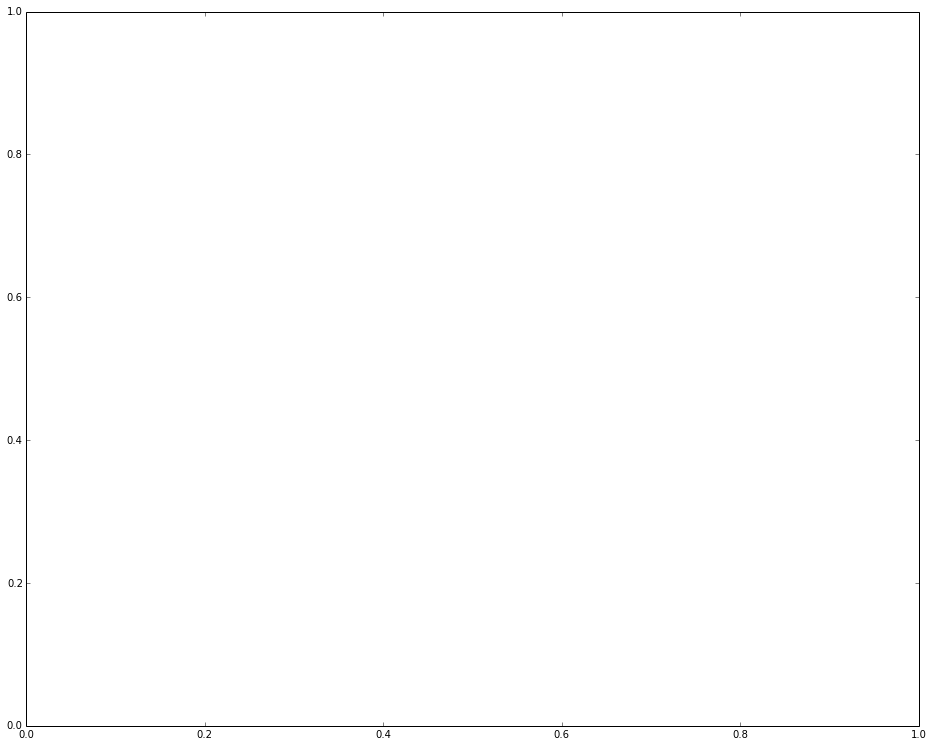

In [66]:
# Also keep in mind that you have the full range of plotting  capabilities available to you. A quick histogram that shows
# how many friends.
plt.hist(ranked_friends.values())
plt.xlabel('Bins (number of friends with shared likes)')
plt.ylabel('Number of shared likes in each bin')

In [67]:
# Keep in mind that you can customize the binning as desired. See http://matplotlib.org/api/pyplot_api.html
# For example...
plt.figure() # Display the previous plot
plt.hist(ranked_friends.values(), bins=np.arange(1,max(ranked_friends.values()),1))
plt.xlabel('Bins (number of friends with shared likes)')
plt.ylabel('Number of shared likes in each bin')
plt.figure() # Display the working plot

ValueError: max() arg is an empty sequence

#### Graphs

http://networkx.lanl.gov/contents.html  
https://www.clear.rice.edu/comp200/12spring/notes/comp140/lab4/  
http://www.cl.cam.ac.uk/~cm542/teaching/2010/stna-pdfs/stna-lecture8.pdf  
https://apps.facebook.com/netvizz/  

In [68]:
friends = [(friend['id'], friend['name'],) for friend in gapi.get_connections('me', 'friends')['data']]

url = 'https://graph.facebook.com/me/mutualfriends/{}?access_token={}'
mutual_friends = {} 

# This loop spawns a separate request for each iteration, so it may take a while. Optimization with a thread pool or similar
# technique would be possible.

#for friend_id, friend_name in friends:
#    r = requests.get(url.format(friend_id, ACCESS_TOKEN,))
#    response_data = json.loads(r.content)['data']
#    mutual_friends[friend_name] = [data['name'] for data in response_data]
#nxg = nx.Graph()
#[nxg.add_edge('me', mfs) for mfs in mutual_friends]
#[nxg.add_edge(f1, f2) for f1 in mutual_friends for f2 in mutual_friends[f1]]

#pickle.dump(nxg, open(os.path.join(outputs,"nxg.pickle"), "wb"))
nxg = pickle.load(open(os.path.join(outputs,"nxg.pickle"), "rb" ))

# Explore what's possible to do with the graph by typing nxg.<tab>

In [69]:
#pos=nx.spring_layout(nxg)
pos=nx.graphviz_layout(nxg,prog='sfdp') #http://stackoverflow.com/questions/21978487/improving-python-networkx-graph-layout

nx.draw_networkx_labels(nxg,pos=pos,font_size=4)
nx.draw(nxg, pos=pos)

InvocationException: Program terminated with status: 1. stderr follows: Error: remove_overlap: Graphviz not built with triangulation library


In [ ]:
#https://networkx.github.io/documentation/latest/examples/drawing/degree_histogram.html

degree_sequence=sorted(nx.degree(nxg).values(),reverse=True) # degree sequence
dmax=max(degree_sequence)

plt.loglog(degree_sequence,'b-',marker='o')
plt.title("Degree rank plot")
plt.ylabel("degree")
plt.xlabel("rank")
#plt.savefig(os.path.join(outputs,"degree_histogram.png"))
plt.show()

In [ ]:
degrees = sorted(nxg.degree().items(), key=operator.itemgetter(1), reverse=True)
high_degrees = [d[0] for d in degrees if d[1] > 150]
nxgh = nxg.subgraph(high_degrees)
pos=nx.graphviz_layout(nxgh,prog='neato')
nx.draw_networkx_labels(nxgh,pos=pos,font_size=10)
nx.draw(nxgh, pos=pos)

In [ ]:
def save_dotfile(g):
    try:
        nx.drawing.write_dot(g, pathdotfile)
        print >> sys.stderr, 'Graph exported for file: {}'.format(pathdotfile)
    except (ImportError, UnicodeEncodeError): 
        # Este bloco serve para usuarios de windows, que certamente terao problemas
        # com o metodo nx.drawing.write_dot. Tambem serve para os casos em que temos
        # problemas com o unicode
        dot = [(n1.replace(' ','_'), n2.replace(' ','_')) for (n1, n2) in g.edges()]
        dot = [(l1.replace('.',''),l2.replace('.','')) for l1,l2 in dot]
        dot = [(l1.replace('-','_'),l2.replace('-','_')) for l1,l2 in dot]
        dot = [u'{} -> {}'.format(n1,n2) for (n1,n2) in dot]
        dot = u";\n".join(dot)
        f = codecs.open(pathdotfile, 'w', encoding='utf-8')
        f.write(u'strict digraph {' + dot + u'}')
        f.close()
        print >> sys.stderr, 'Graph exported for file: {}'.format(pathdotfile)
        return f.name

In [ ]:
save_dotfile(nxgh)

In [ ]:
#Chamando um programa externo ao Ipython com o operador !
!dot -Tpng /home/rsouza/Dropbox/Renato/ModMinDados/outputs/fb_graph_fof.dot -o /home/rsouza/Dropbox/Renato/ModMinDados/outputs/fb_graph_fof.png
Image('/home/rsouza/Dropbox/Renato/ModMinDados/outputs/fb_graph_fof.png')

In [ ]:
# Finding cliques is a hard problem, so this could take a while for large graphs.
# See http://en.wikipedia.org/wiki/NP-complete and http://en.wikipedia.org/wiki/Clique_problem.

cliques = [c for c in nx.find_cliques(nxg)]
num_cliques = len(cliques)
clique_sizes = [len(c) for c in cliques]
max_clique_size = max(clique_sizes)
avg_clique_size = sum(clique_sizes) / num_cliques
max_cliques = [c for c in cliques if len(c) == max_clique_size]
num_max_cliques = len(max_cliques)
max_clique_sets = [set(c) for c in max_cliques]
friends_in_all_max_cliques = list(reduce(lambda x, y: x.intersection(y), max_clique_sets))

In [ ]:
print 'Num cliques:', num_cliques
print 'Avg clique size:', avg_clique_size
print 'Max clique size:', max_clique_size
print 'Num max cliques:', num_max_cliques

In [ ]:
print 'Friends in all max cliques:'
print json.dumps(friends_in_all_max_cliques, indent=1)

In [ ]:
print 'Max cliques:'
print json.dumps(max_cliques, indent=1)

In [ ]:
nld = json_graph.node_link_data(nxgh) #nxg has too many nodes to display...
json.dump(nld, open(os.path.join(outputs,'force.json'),'w'))

In [ ]:
#Download force.html template from:
#https://github.com/furukama/Mining-the-Social-Web-2nd-Edition/blob/master/ipynb/resources/ch02-facebook/viz/force.html

viz_file = os.path.join(outputs,'force.html')
webbrowser.open('file://' + viz_file)

In [ ]:
def generate_rgraph_friends_bygroup():
    # Uses the previously saved JSON file
    rgraph = json.loads(open(dumpjson).read())
    groups = gapi.get_connections('me', 'groups')
    # Display groups and prompt the user
    for i in range(len(groups['data'])):
        print(u'{}) {}'.format(i, groups['data'][i]['name']))
    choice = int(raw_input('Choose a group for your graphic: '))
    g_id = groups['data'][choice]['id']
    # Find the friends in the group
    fql = FQL(ACCESS_TOKEN)
    q = """select uid from group_member where gid = {} and uid in (select target_id\
    from connection where source_id = me() and target_type = 'user')""".format(g_id, )
    u_ids = [u['uid'] for u in fql.query(q)]
    # Filter the previously generated output for these ids
    filtered_rgraph = [n for n in rgraph if n['id'] in u_ids]
    # Trim down adjancency lists for anyone not appearing in the graph.
    # Note that the full connection data displayed as HTML markup
    # in "connections" is still preserved for the global graph.
    for n in filtered_rgraph:
        n['adjacencies'] = [a for a in n['adjacencies'] if a in u_ids]
    html = open(rgraphtemplate).read() %(json.dumps(filtered_rgraph),)
    f = open(rgraphfile2, 'w')
    f.write(html)
    f.close()
    print('Data exported to file: {}'.format(f.name))

In [ ]:
generate_rgraph_friends_bygroup()

# Open up the web page in your browser
webbrowser.open(os.path.join('file://', rgraphfile2))
#!chromium /home/rsouza/Dropbox/Renato/ModMinDados/outputs/fb_amigos_group.html

#### Generating Tag_Cloud

In [ ]:
def weightTermByFreq(f, minfr,maxfr,minfo,maxfo):
    return (f - minfr) * (maxfo - minfo) / (maxfr - minfr) + minfo

In [ ]:
def generate_tag_cloud():
    '''
    Implementation adapted from:
    http://help.com/post/383276-anyone-knows-the-formula-for-font-s
    '''
    BASE_URL = 'https://graph.facebook.com/me/home?access_token='
    NUM_PAGES = 5
    MIN_FREQUENCY = 1
    MIN_FONT_SIZE = 3
    MAX_FONT_SIZE = 20
    # Loop through the pages of connection data and build up messages
    url = BASE_URL + ACCESS_TOKEN
    messages = []
    current_page = 0
    while current_page < NUM_PAGES:
        data = json.loads(urllib2.urlopen(url).read())
        messages += [d['message'] for d in data['data'] if d.get('message')]
        current_page += 1
        if u'paging' in data:
            url = data[u'paging'][u'next']
        else:
            break
    # Compute frequency distribution for the terms
    fdist = nltk.FreqDist([term for m in messages for term in m.split()])
    # Customize a list of stop words as needed
    stop_words = nltk.corpus.stopwords.words('english')
    stop_words += nltk.corpus.stopwords.words('portuguese')
    stop_words += ['&', '.', '?', '!','...']
    # Create output for the WP-Cumulus tag cloud and sort terms by freq along the way
    raw_output = sorted([[escape(term), '', freq] for (term, freq) in fdist.items()
                        if freq > MIN_FREQUENCY and term not in stop_words],
                        key=lambda x: x[2])
    min_freq = raw_output[0][2]
    max_freq = raw_output[-1][2]
    weighted_output = [[i[0], i[1], weightTermByFreq(i[2], min_freq,max_freq, MIN_FONT_SIZE,MAX_FONT_SIZE)] for i in raw_output]
    # Substitute the JSON data structure into the template
    html_page = open(tagcloudtemplate).read() % (json.dumps(weighted_output), )
    f = open(graphcloudfile, 'w')
    f.write(html_page)
    f.close()
    print('Data exported to file: {}'.format(f.name))

In [ ]:
generate_tag_cloud()
# Open up the web page in your browser
webbrowser.open('file://' + graphcloudfile)
#!chromium /home/rsouza/Dropbox/Renato/ModMinDados/outputs/fb_tag_cloud.html